# 프로젝트 1: Image Classification

In [1]:
# 라이브러리 불러오기
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# 데이터 불러오기 및 경로 설정
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)

path = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

68606236/68606236 [==============================] - 3s 0us/step


In [3]:
# train, test 데이터 경로 설정
train_dir = os.path.join(path, 'train')
validation_dir = os.path.join(path, 'validation')
print(train_dir)
print(validation_dir)

/root/.keras/datasets/cats_and_dogs_filtered/train
/root/.keras/datasets/cats_and_dogs_filtered/validation


In [4]:
# 개/고양이 데이터 경로 설정
# directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats')
print(train_cats_dir)

# directory with our training dog pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')
print(train_dogs_dir)

# directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')
print(validation_cats_dir)

# directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')
print(validation_dogs_dir)

/root/.keras/datasets/cats_and_dogs_filtered/train/cats
/root/.keras/datasets/cats_and_dogs_filtered/train/dogs
/root/.keras/datasets/cats_and_dogs_filtered/validation/cats
/root/.keras/datasets/cats_and_dogs_filtered/validation/dogs


In [5]:
# train, test 데이터 경로 확인
num_cats_tr = len(os.listdir(train_cats_dir))
print('total training cat images:', num_cats_tr)
num_dogs_tr = len(os.listdir(train_dogs_dir))
print('total training dog images:', num_dogs_tr)

print("--")

num_cats_val = len(os.listdir(validation_cats_dir))
print('total validation cat images:', num_cats_val)
num_dogs_val = len(os.listdir(validation_dogs_dir))
print('total validation dog images:', num_dogs_val)

print("--")

total_train = num_cats_tr + num_dogs_tr
print("Total training images:", total_train)
total_val = num_cats_val + num_dogs_val
print("Total validation images:", total_val)

total training cat images: 1000
total training dog images: 1000
--
total validation cat images: 500
total validation dog images: 500
--
Total training images: 2000
Total validation images: 1000


## 1-1 VGG16 코드 구현

In [6]:
# parameter Initialization
batch_size = 64
epochs = 5
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [7]:
# 데이터를 시각화하기 위한 함수
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

In [8]:
# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True,
                                     vertical_flip=False)

In [9]:
train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

Found 2000 images belonging to 2 classes.


In [10]:
train_data_gen[0][0].shape

(64, 256, 256, 3)

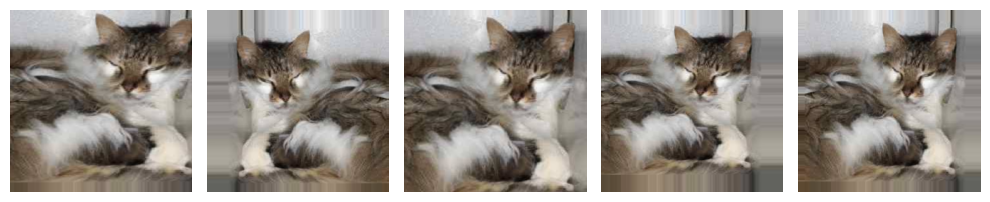

In [11]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

In [12]:
# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

In [13]:
val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 1000 images belonging to 2 classes.


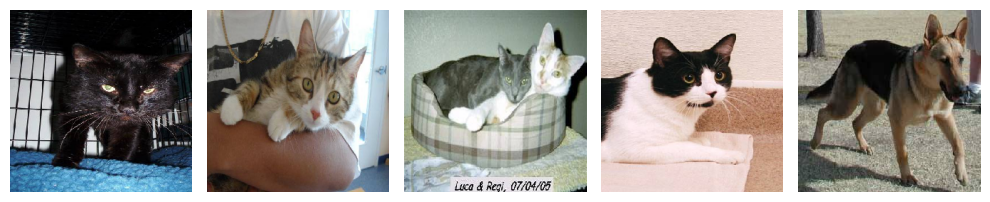

In [14]:
sample_training_images, _ = next(val_data_gen)
plotImages(sample_training_images[:5])

In [15]:
_[:5] # 정답 데이터

array([0., 0., 0., 0., 1.], dtype=float32)

In [16]:
# # VGG 16 코드
# input_layer=tf.keras.layers.Input(shape=(256, 256, 3))
# x = tf.keras.layers.Conv2D(64, (3,3), strides=1, activation='relu', padding='same')(input_layer)
# x = tf.keras.layers.Conv2D(64, (3,3), strides=1, activation='relu', padding='same')(x)
# x = tf.keras.layers.MaxPool2D((2, 2))(x)

# x = tf.keras.layers.Conv2D(128, (3,3), strides=1, activation='relu', padding='same')(x)
# x = tf.keras.layers.Conv2D(128, (3,3), strides=1, activation='relu', padding='same')(x)
# x = tf.keras.layers.MaxPool2D((2, 2))(x)

# x = tf.keras.layers.Conv2D(256, (3,3), strides=1, activation='relu', padding='same')(x)
# x = tf.keras.layers.Conv2D(256, (3,3), strides=1, activation='relu', padding='same')(x)
# x = tf.keras.layers.Conv2D(256, (3,3), strides=1, activation='relu', padding='same')(x)
# x = tf.keras.layers.MaxPool2D((2, 2))(x)

# x = tf.keras.layers.Conv2D(512, (3,3), strides=1, activation='relu', padding='same')(x)
# x = tf.keras.layers.Conv2D(512, (3,3), strides=1, activation='relu', padding='same')(x)
# x = tf.keras.layers.Conv2D(512, (3,3), strides=1, activation='relu', padding='same')(x)
# x = tf.keras.layers.MaxPool2D((2, 2))(x)

# x = tf.keras.layers.Conv2D(512, (3,3), strides=1, activation='relu', padding='same')(x)
# x = tf.keras.layers.Conv2D(512, (3,3), strides=1, activation='relu', padding='same')(x)
# x = tf.keras.layers.Conv2D(512, (3,3), strides=1, activation='relu', padding='same')(x)
# x = tf.keras.layers.MaxPool2D((2, 2))(x)

# x=tf.keras.layers.Flatten()(x)
# x=tf.keras.layers.Dense(4096, activation='relu')(x)
# x=tf.keras.layers.Dense(4096, activation='relu')(x)
# x=tf.keras.layers.Dense(1000, activation='relu')(x)
# out_layer=tf.keras.layers.Dense(1, activation='sigmoid')(x)

# model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])
# model.summary()

In [17]:
# loss_function=tf.keras.losses.binary_crossentropy
# optimize=tf.keras.optimizers.Adam(learning_rate=0.01)
# metric=tf.keras.metrics.binary_accuracy
# model.compile(loss=loss_function,
#               optimizer=optimize,
#               metrics=[metric])

# # callbacks_list= [tf.keras.callbacks.TensorBoard(log_dir='log_dir', histogram_freq=1)]

In [18]:
# history = model.fit(
#       train_data_gen,
#       steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
#       epochs=epochs,
#       validation_data=val_data_gen,
#       # callbacks=callbacks_list,
#       validation_freq=1)

In [19]:
# acc = history.history['binary_accuracy']
# val_acc = history.history['val_binary_accuracy']
# loss = history.history['loss']
# val_loss = history.history['val_loss']

# epochs_range = range(len(acc))

# plt.plot(epochs_range, acc, 'bo', label='Training acc')
# plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
# plt.title('Training and validation accuracy')
# plt.legend()

# plt.figure()

# plt.plot(epochs_range, loss, 'bo', label='Training loss')
# plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
# plt.title('Training and validation loss')
# plt.legend()

# plt.show()

## 1-2 성능 향상 시키기

In [20]:
# 문제 1-2. hyperparameter 설정
batch_size = 32
epochs = 8
IMG_HEIGHT = 64
IMG_WIDTH = 64

In [21]:
# 문제 1-2. 데이터 generator 생성
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True,
                                     vertical_flip=False)

train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

image_gen_val = ImageDataGenerator(rescale=1./255)

val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [22]:
# 문제 1-2. 모델 구현
input_layer=tf.keras.layers.Input(shape=(64, 64, 3))
x=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(input_layer)
x=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(256, activation='relu')(x)
x=tf.keras.layers.Dense(128, activation='relu')(x)
out_layer=tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 conv2d (Conv2D)             (None, 64, 64, 32)        896       
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        9248      
                                                                 
 batch_normalization (Batch  (None, 64, 64, 32)        128       
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 32)        0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 64)        18496 

In [23]:
# 문제 1-2. loss function, optimizer, metric 설정 및 모델 컴파일
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.01)
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

callbacks_list= [tf.keras.callbacks.TensorBoard(log_dir='log_dir', histogram_freq=1)
]

In [24]:
# 모델 학습
history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      callbacks=callbacks_list,
      validation_freq=1)

Epoch 1/8
62/62 [==============================] - 22s 121ms/step - loss: 2.6417 - binary_accuracy: 0.5320 - val_loss: 9.2044 - val_binary_accuracy: 0.5010
Epoch 2/8
62/62 [==============================] - 8s 123ms/step - loss: 0.7050 - binary_accuracy: 0.5445 - val_loss: 1.2093 - val_binary_accuracy: 0.5010
Epoch 3/8
62/62 [==============================] - 7s 105ms/step - loss: 0.6782 - binary_accuracy: 0.5575 - val_loss: 0.7107 - val_binary_accuracy: 0.5510
Epoch 4/8
62/62 [==============================] - 8s 123ms/step - loss: 0.6748 - binary_accuracy: 0.5895 - val_loss: 0.7194 - val_binary_accuracy: 0.5780
Epoch 5/8
62/62 [==============================] - 9s 137ms/step - loss: 0.6748 - binary_accuracy: 0.5865 - val_loss: 0.6984 - val_binary_accuracy: 0.5830
Epoch 6/8
62/62 [==============================] - 8s 128ms/step - loss: 0.6702 - binary_accuracy: 0.5715 - val_loss: 0.6741 - val_binary_accuracy: 0.5780
Epoch 7/8
62/62 [==============================] - 7s 108ms/step - lo

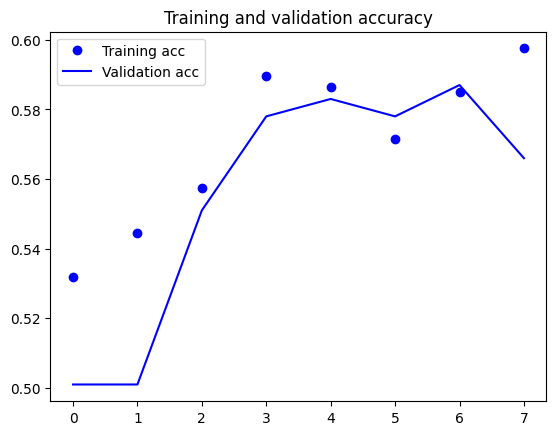

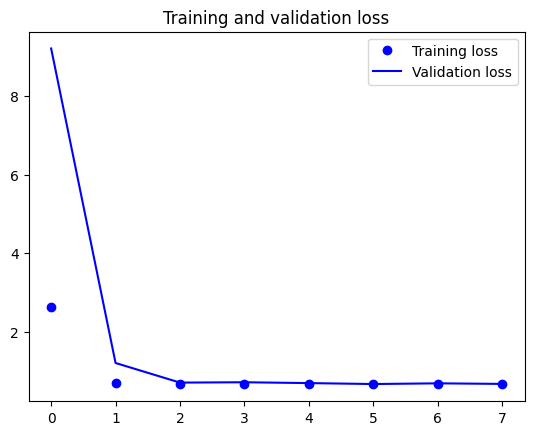

In [25]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

# 프로젝트 2: Object Detection

In [26]:
# !pip3 install tensorflow-estimator==2.6.0

In [27]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

In [28]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

In [29]:
def download_and_resize_image(url, new_width=256, new_height=256, display=False):

  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

In [30]:
def draw_bounding_box_on_image(image,
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):

  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]

  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height

  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

In [31]:
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

<ipython-input-29-122c7be17db6>:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정


Image downloaded to /tmp/tmpjkpl8p5l.jpg.


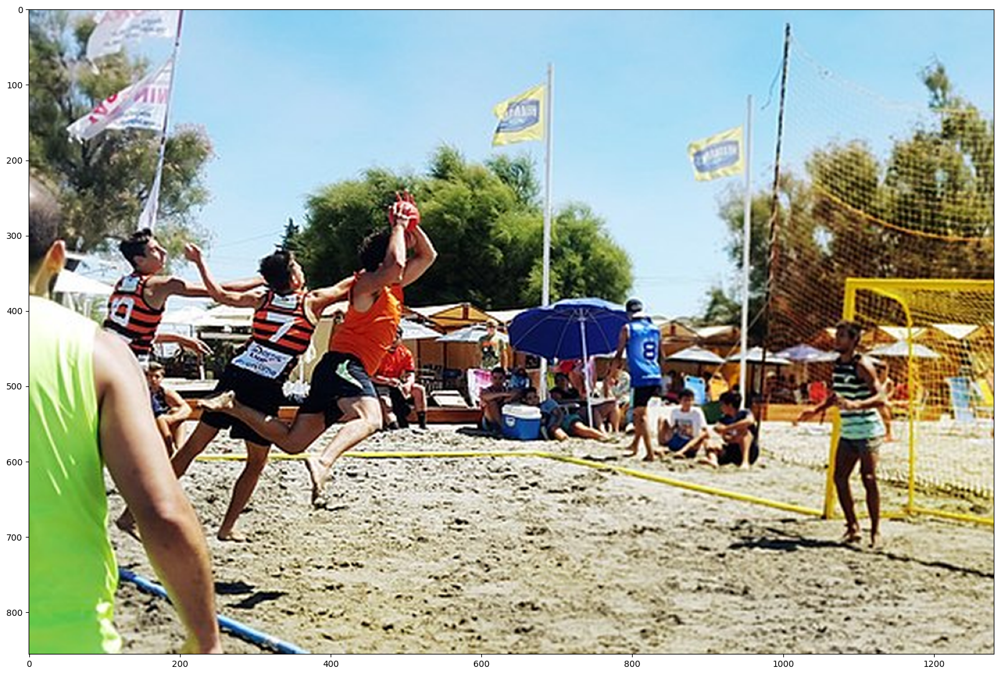

In [32]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

In [33]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

In [34]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [35]:
def run_detector(detector, path):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

  print(result["detection_class_entities"])

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

Found 100 objects.
Inference time:  49.41775608062744
[b'Man' b'Person' b'Man' b'Clothing' b'Clothing' b'Man' b'Person' b'Man'
 b'Woman' b'Person' b'Clothing' b'Clothing' b'Person' b'Person'
 b'Umbrella' b'Man' b'Tree' b'Person' b'Man' b'Woman' b'Person' b'Man'
 b'Woman' b'Woman' b'Person' b'Clothing' b'Tree' b'Tree' b'Tree' b'Man'
 b'Tree' b'Man' b'Clothing' b'Footwear' b'Clothing' b'Woman' b'Tree'
 b'Clothing' b'Man' b'Person' b'Woman' b'Human leg' b'Clothing' b'Man'
 b'Boy' b'Woman' b'Person' b'Tree' b'Human leg' b'Tree' b'Human face'
 b'Woman' b'Woman' b'Woman' b'Man' b'Human hair' b'Person' b'Man' b'Man'
 b'Boy' b'Boy' b'Person' b'Boy' b'Clothing' b'Tree' b'Girl' b'Clothing'
 b'Man' b'Girl' b'Man' b'Clothing' b'Human arm' b'Man' b'Girl' b'Woman'
 b'Human arm' b'Clothing' b'Man' b'Sports uniform' b'Girl' b'Footwear'
 b'Mammal' b'Person' b'Girl' b'Human leg' b'Person' b'Boy' b'Footwear'
 b'Person' b'Human leg' b'Human head' b'Boy' b'Mammal' b'Mammal'
 b'Hiking equipment' b'Human bod

<ipython-input-30-71c58834bf8f>:19: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
<ipython-input-30-71c58834bf8f>:29: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


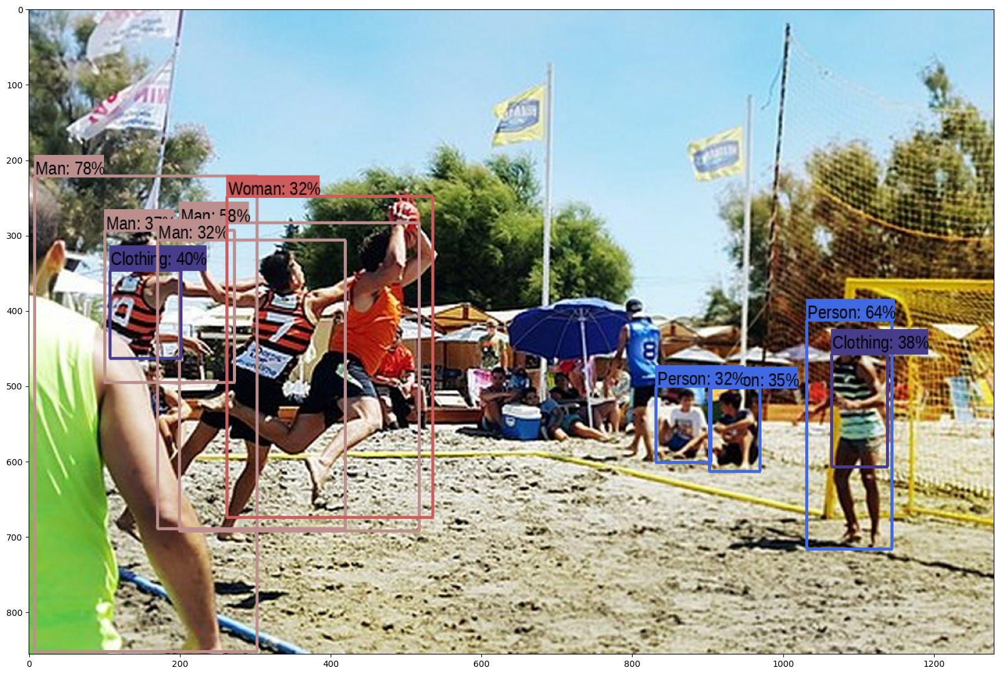

In [36]:
run_detector(detector, downloaded_image_path)

## 2-1. 다른 이미지 테스트해보기

<ipython-input-29-122c7be17db6>:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정


Image downloaded to /tmp/tmpuaq2ewlh.jpg.


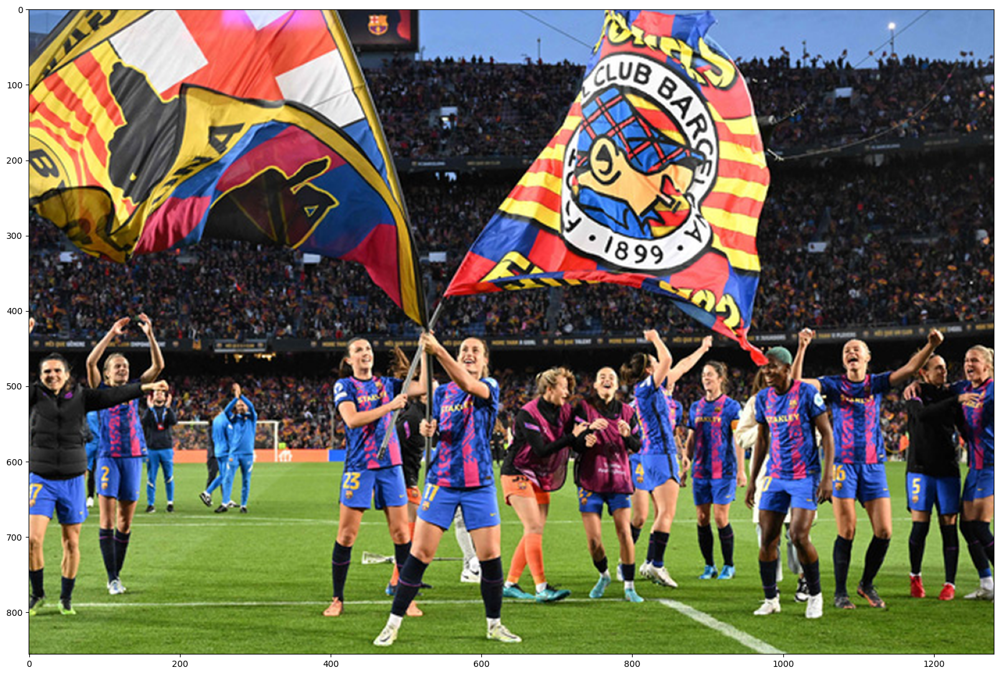

In [37]:
# 이미지 불러오기
image_url = "https://news.kbs.co.kr/data/news/2022/04/23/20220423_vrdmQA.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  1.1942918300628662
[b'Person' b'Person' b'Person' b'Person' b'Person' b'Person' b'Person'
 b'Person' b'Person' b'Sports equipment' b'Flag' b'Man' b'Person' b'Flag'
 b'Person' b'Person' b'Person' b'Person' b'Footwear' b'Woman' b'Footwear'
 b'Footwear' b'Footwear' b'Footwear' b'Woman' b'Woman' b'Sports equipment'
 b'Sports equipment' b'Person' b'Footwear' b'Man' b'Woman' b'Footwear'
 b'Clothing' b'Clothing' b'Footwear' b'Sports equipment' b'Footwear'
 b'Footwear' b'Woman' b'Sports equipment' b'Sports equipment' b'Man'
 b'Clothing' b'Footwear' b'Woman' b'Clothing' b'Woman' b'Clothing'
 b'Woman' b'Clothing' b'Clothing' b'Clothing' b'Woman' b'Footwear'
 b'Clothing' b'Person' b'Girl' b'Footwear' b'Man' b'Man' b'Footwear'
 b'Clothing' b'Sports equipment' b'Footwear' b'Clothing' b'Footwear'
 b'Footwear' b'Girl' b'Man' b'Woman' b'Footwear' b'Sports equipment'
 b'Shorts' b'Girl' b'Girl' b'Woman' b'Sports equipment' b'Footwear'
 b'Girl' b'Footwear' b'Sports equ

<ipython-input-30-71c58834bf8f>:19: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
<ipython-input-30-71c58834bf8f>:29: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


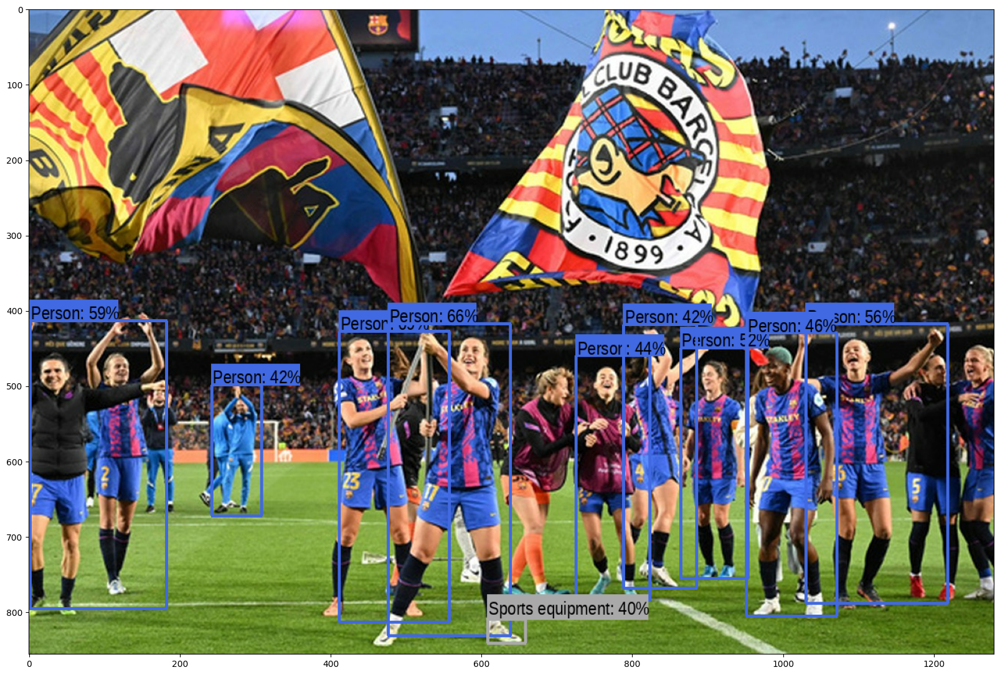

In [38]:
# 테스트
run_detector(detector, downloaded_image_path)

## 2-2. 다양한 pre-trained model 테스트해보기

In [39]:
# 문제 2-2. 모델 불러오기
module_handle = "https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1"
detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

<ipython-input-29-122c7be17db6>:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정


Image downloaded to /tmp/tmp7ew498eq.jpg.


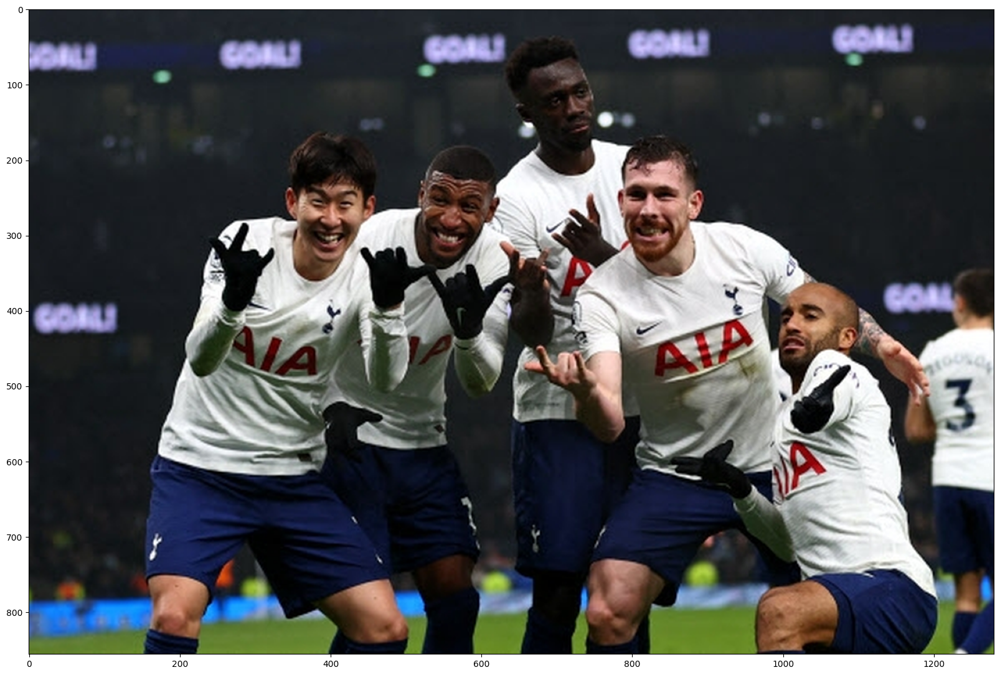

In [40]:
# 이미지 불러오기
image_url = "https://img.seoul.co.kr/img/upload/2021/12/27/SSI_20211227175532_O2.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

Found 100 objects.
Inference time:  10.539419889450073
[b'Man' b'Man' b'Human face' b'Man' b'Man' b'Man' b'Man' b'Man'
 b'Human face' b'Human face' b'Clothing' b'Man' b'Human face' b'Clothing'
 b'Clothing' b'Clothing' b'Footwear' b'Man' b'Clothing' b'Footwear'
 b'Footwear' b'Human face' b'Footwear' b'Footwear' b'Footwear' b'Clothing'
 b'Human arm' b'Shorts' b'Clothing' b'Shorts' b'Clothing' b'Clothing'
 b'Footwear' b'Human arm' b'Man' b'Clothing' b'Man' b'Clothing' b'Man'
 b'Woman' b'Human hair' b'Footwear' b'Human hair' b'Shorts' b'Man'
 b'Footwear' b'Footwear' b'Man' b'Clothing' b'Human arm' b'Clothing'
 b'Clothing' b'Person' b'Man' b'Clothing' b'Human hair' b'Jeans'
 b'Clothing' b'Clothing' b'Clothing' b'Footwear' b'Human leg' b'Boy'
 b'Man' b'Footwear' b'Man' b'Human arm' b'Human arm' b'Clothing' b'Man'
 b'Clothing' b'Man' b'Boy' b'Footwear' b'Human hair' b'Boy' b'Man'
 b'Human arm' b'Human leg' b'Tree' b'Human face' b'Human arm' b'Clothing'
 b'Clothing' b'Man' b'Footwear' b'Clothi

<ipython-input-30-71c58834bf8f>:19: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
<ipython-input-30-71c58834bf8f>:29: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


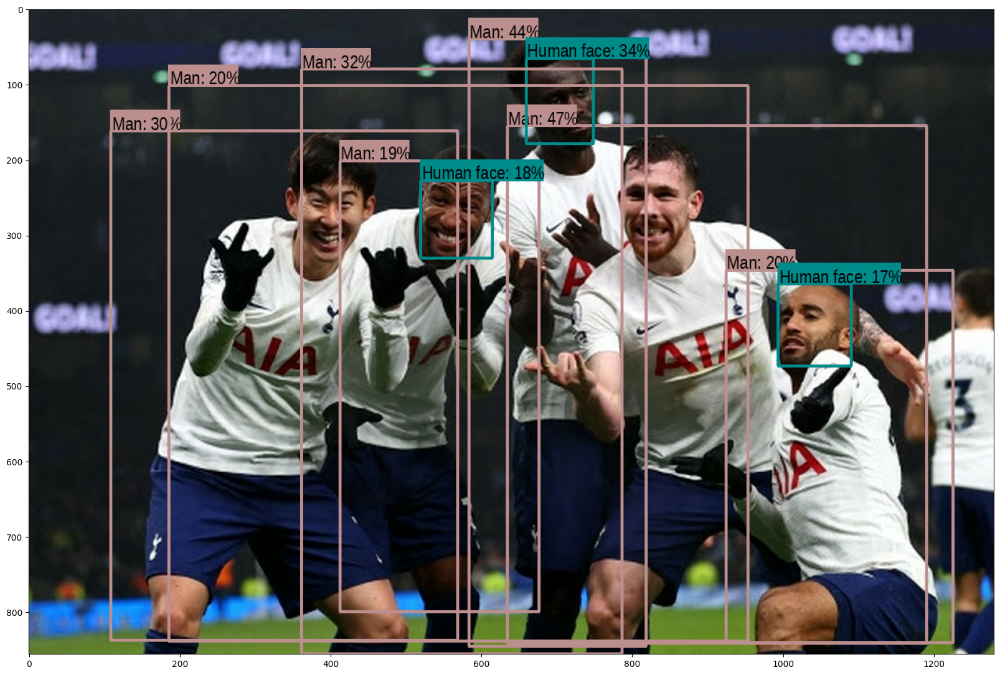

In [41]:
# 문제 2-2. 테스트
run_detector(detector, downloaded_image_path)

In [42]:
  # 문제 2-2. 결과 비교
print("1번째 모델인 Inception ResNet을 사용한 Faster RCNN은 조금 느리지만 높은 정확성을 보였습니다.")
print("2번째 모델인 ImagneNet을 사용한 mobilenet은 모델 크기가 작아 속도는 빠르지만 정확성은 상대적으로 떨어진다. ")

1번째 모델인 Inception ResNet을 사용한 Faster RCNN은 조금 느리지만 높은 정확성을 보였습니다.
2번째 모델인 ImagneNet을 사용한 mobilenet은 모델 크기가 작아 속도는 빠르지만 정확성은 상대적으로 떨어진다. 
